# Introduction

In order to learn to represent 3D objects and scenes from photographs for the aim of creating photorealistic fresh views, neural volumetric representations, such as neural radiance fields (NeRF), have emerged as a compelling technique.
Despite the fact that NeRF and its variations have produced outstanding results for a variety of view synthesis applications, NeRF's rendering model has a weakness that can lead to severe aliasing and blurring. NeRF substitutes a continuous volumetric function for conventional discrete sampled geometry, parameterized as a multilayer perceptron (MLP), which maps from an input 5D coordinate (i.e., a 3D position and a 2D viewing direction) to scene characteristics (i.e., volume density and view-dependent emitted radiance) at that location.

In [170]:
#Library initialization
import numpy as np

import torch

import math
import torch.nn as nn
import torch.nn.functional as F

import imageio

from tqdm import tqdm_notebook as tqdm

import os

import matplotlib.pyplot as plt

%matplotlib inline
from ipywidgets import interactive, widgets


In [171]:
print("PyTorch version:", torch.__version__)
print("torch GPU:", torch.cuda.is_available())

PyTorch version: 1.13.0+cu116
torch GPU: True


# Dataset


The Blender Dataset used in Mip-NeRF: A Multiscale Representation for Anti-Aliasing Neural Radiance
Fields. Blender NeRF is an add-on for Blender that lets you create virtual datasets that an AI may use to create composite images from oblique angles. The created datasets can be used directly to train and test a Neural Radiance Field (NeRF) model, producing artificial intelligence (AI) predicted images in a matter of seconds.

In [172]:
if not os.path.exists('tiny_nerf_data.npz'):
    !wget https://people.eecs.berkeley.edu/~bmild/nerf/tiny_nerf_data.npz

## cumsum


In [173]:
def tr_cs_exclusive(tensor, dim=-1):
  # Works for last dimension
  dim = -1

  cumsum = torch.cumsum(tensor, dim)
  
  # Rolls elements by 1 element along dimension
  cumsum = torch.roll(cumsum, 1, dim)
  
  # Replace first element by 0
  cumsum[..., 0] = 0.
  return cumsum

## cumprod

In [174]:
def t_cumprod_exclusive(tensor, dim=-1):
  # Only works for the last dimension (dim=-1)
  dim = -1

  cumprod = torch.cumprod(tensor, dim)
  
  # Rolls the elements along dimension 'dim' by 1 element
  cumprod = torch.roll(cumprod, 1, dim)
  
  # Replaces first element by 1 
  cumprod[..., 0] = 1.
  return cumprod

# Method

## Positional encoding
###The MLP can express higher frequency functions thanks to a positional encoding, and we provide a hierarchical sampling method to cut down on the number of queries needed to appropriately sample this high-frequency scene representation.

In [175]:
def posenc_pt(x, len_embed=6):
  rets = [x]
  for i in range(len_embed):
      for fn in [torch.sin, torch.cos]:
          rets.append(fn(2.**i * x))
  return torch.cat(rets, -1)

arr_np = np.random.uniform(size=(2, 3))
arr_pt = torch.from_numpy(arr_np)


In [176]:
def cumprod_exclusive(tensor):
  # Works for the last dimension
  dim = -1

  cumprod = torch.cumprod(tensor, dim)
  
  # Rolls the elements along dimension 'dim' by 1 element
  cumprod = torch.roll(cumprod, 1, dim)

  # Replaces the first element by 0
  cumprod[..., 0] = 1.
  return cumprod

def meshgrid_xy(tensor1, tensor2):
    ii, jj = torch.meshgrid(tensor1, tensor2)
    return ii.transpose(-1, -2), jj.transpose(-1, -2)

## Volume rendering

To render the scene from any angle, volume rendering is used to aggregate samples of this scene's representation along rays. Here, we exhibit two new views produced from our optimized representation along with the collection of input views of the synthetic scenes randomly collected on a nearby hemisphere.

In [177]:
def volume_rendering_torch(raw, rays_o, z_vals):
  sigma_a = torch.nn.functional.relu(raw[..., 3])

  rgb = torch.sigmoid(raw[..., :3])

  one_e_10 = torch.tensor([1e10], dtype=rays_o.dtype, device=rays_o.device)

  dists = torch.cat((z_vals[..., 1:] - z_vals[..., :-1], one_e_10.expand(z_vals[..., :1].shape)), dim=-1)

  alpha = 1. - torch.exp(-sigma_a * dists)

  weights = alpha * cumprod_exclusive(1. - alpha + 1e-10)

  rgb_map = (weights[..., None] * rgb).sum(dim=-2)
  depth_map = (weights * z_vals).sum(dim=-1)
  acc_map = weights.sum(-1)

  return rgb_map, depth_map, acc_map


raw_np = np.random.uniform(size=(2, 2, 8, 4)).astype(np.float32)
raw_pt = torch.from_numpy(raw_np)

rays_o_np = np.random.uniform(size=(2, 2, 3)).astype(np.float32)
rays_o_pt = torch.from_numpy(rays_o_np)

z_vals_np = np.random.uniform(size=(8)).astype(np.float32)
z_vals_pt = torch.from_numpy(z_vals_np)

rgb_pt, depth_pt, acc_pt = volume_rendering_torch(raw_pt, rays_o_pt, z_vals_pt)


In [178]:
def compute_query_pts_pt(rays_o, rays_d, near, far, num_samples):

  z_vals = torch.linspace(near, far, num_samples).to(rays_o)

  samples = np.random.uniform(size=tuple(list(rays_o.shape[:-1]) + [num_samples])).astype(np.float32)

  print(z_vals.shape, samples.shape, rays_o.shape)
  z_vals = z_vals + torch.from_numpy(samples).to(rays_o)

  pts = rays_o[..., None, :] + rays_d[..., None, :] * z_vals[..., :, None]
  return pts


rays_o_np = np.random.uniform(size=(2, 2, 3)).astype(np.float32)
rays_o_pt = torch.from_numpy(rays_o_np)

rays_d_np = np.random.uniform(size=(2, 2, 3)).astype(np.float32)
rays_d_pt = torch.from_numpy(rays_o_np)

pts_pt = compute_query_pts_pt(rays_o_pt, rays_d_pt, near=2., far=6., num_samples=8)


torch.Size([8]) (2, 2, 8) torch.Size([2, 2, 3])


In [179]:
def get_rays_pt(H, W, focal, c2w):
    ii, jj = meshgrid_xy(torch.arange(W).to(c2w), torch.arange(H).to(c2w))
    dirs = torch.stack([(ii - W * .5) / focal, -(jj - H * .5) / focal, -torch.ones_like(ii)], -1)
    rays_d = torch.sum(dirs[..., None, :] * c2w[:3, :3], -1)
    rays_o = c2w[:3, -1].expand(rays_d.shape)
    return rays_o, rays_d
  
def get_rays_np(H, W, focal, c2w):
    i, j = np.meshgrid(np.arange(W, dtype=np.float32), np.arange(H, dtype=np.float32), indexing='xy')
    dirs = np.stack([(i - W * .5) / focal, -(j - H * .5) / focal, -np.ones_like(i)], -1)
    rays_d = np.sum(dirs[..., np.newaxis, :] * c2w[:3, :3], -1)
    rays_o = np.broadcast_to(c2w[:3, -1], np.shape(rays_d))
    return rays_o, rays_d

c2w_np = np.random.uniform(size=(4, 4)).astype(np.float32)
c2w_pt = torch.from_numpy(c2w_np)
rays_o_pt, rays_d_pt = get_rays_pt(2, 2, 1.732, c2w_pt)
rays_o_np, rays_d_np = get_rays_np(2, 2, 1.732, c2w_np)
print(np.allclose(rays_o_pt.numpy(), rays_o_np))
print(np.allclose(rays_d_pt.numpy(), rays_d_np))

True
True


In [181]:
def get_rays(H, W, focal, c2w):
    ii, jj = meshgrid_xy(torch.arange(W).to(c2w), torch.arange(H).to(c2w))
    dirs = torch.stack([(ii - W * .5) / focal, -(jj - H * .5) / focal, -torch.ones_like(ii)], -1)
    rays_d = torch.sum(dirs[..., None, :] * c2w[:3, :3], -1)
    rays_o = c2w[:3, -1].expand(rays_d.shape)
    return rays_o, rays_d

In [182]:
def posenc(x, len_embed=6):
    rets = [x]
    for i in range(len_embed):
        for fn in [torch.sin, torch.cos]:
            rets.append(fn(2.**i * x))
    return torch.cat(rets, -1)

In [183]:
class TinyNerfModel(torch.nn.Module):
    
    def __init__(self, depth=8, width=256, len_embed=6, skip_connect_every=4):
        super(TinyNerfModel, self).__init__()
        self.depth = 8
        self.width = 256
        self.input_size = 3 + 3 * 2 * len_embed
        self.input_linear_layer = torch.nn.Linear(self.input_size, self.width)
        self.skip_connect_every = skip_connect_every
        self.linear_layers = torch.nn.ModuleList()
        for i in range(self.depth):
            if i % self.skip_connect_every == 0 and i > 0 and i != self.depth - 1:
                self.linear_layers.append(
                    torch.nn.Linear(self.input_size + self.width, self.width)
                )
            else:
                self.linear_layers.append(torch.nn.Linear(self.width, self.width))

        self.output_linear_layer = torch.nn.Linear(self.width, 4)
        self.relu = torch.nn.functional.relu

    def forward(self, x):
        x_in = x.clone()
        x = self.input_linear_layer(x)
        for i in range(len(self.linear_layers)):
            if i % self.skip_connect_every == 0 and i > 0 and i != len(self.linear_layers) - 1:
                x = self.relu(torch.cat((x, x_in), -1))
            x = self.relu(self.linear_layers[i](x))
        x = self.output_linear_layer(x)
        return x

class TwoLayerNerfModel(torch.nn.Module):
  def __init__(self, width=128, len_embed=6):
    super(TwoLayerNerfModel, self).__init__()
    self.fc1 = torch.nn.Linear(3 + 3 * 2 * len_embed, width)
    self.fc2 = torch.nn.Linear(width, width)
    self.fc3 = torch.nn.Linear(width, 4)
  def forward(self, x):
    x = torch.nn.functional.relu(self.fc1(x))
    x = torch.nn.functional.relu(self.fc2(x))
    return self.fc3(x)

In [184]:
def get_minibatches(inputs, chunk=1024*8):
  return [inputs[i:i+chunk] for i in range(0, inputs.shape[0], chunk)]

In [185]:
def render_rays(network_fn, rays_o, rays_d, near, far, num_samples, rand=False,
                embed_fn=posenc):

    z_vals = torch.linspace(near, far, num_samples).to(rays_o)
    if rand:

        z_vals = z_vals + (torch.rand(list(rays_o.shape[:-1]) + [num_samples])).to(rays_o) * (far - near) / num_samples

    pts = rays_o[..., None, :] + rays_d[..., None, :] * z_vals[..., :, None]

    pts_flat = torch.reshape(pts, (-1, 3))
    pts_flat = embed_fn(pts_flat)

    chunksize = 4096
    batches = get_minibatches(pts_flat, chunk=chunksize)
    preds = []
    for batch in batches:
      preds.append(model(batch))
    raw = torch.cat(preds, 0)
    raw = torch.reshape(raw, list(pts.shape[:-1]) + [4])

    sigma_a = torch.nn.functional.relu(raw[..., 3])

    rgb = torch.sigmoid(raw[..., :3])

    one_e_10 = torch.tensor([1e10], dtype=rays_o.dtype, device=rays_o.device)

    dists = torch.cat((z_vals[..., 1:] - z_vals[..., :-1], one_e_10.expand(z_vals[..., :1].shape)), dim=-1)

    alpha = 1. - torch.exp(-sigma_a * dists)

    weights = alpha * cumprod_exclusive(1. - alpha + 1e-10)

    rgb_map = (weights[..., None] * rgb).sum(dim=-2)

    depth_map = (weights * z_vals).sum(dim=-1)

    acc_map = weights.sum(-1)

    return rgb_map, depth_map, acc_map

## Optimize NeRF

A few tweaks that barely affect the model's speed or accuracy but slightly simplify our approach and boost its robustness during optimization.

In [186]:
data = np.load("tiny_nerf_data.npz")
images = data["images"]
poses = data["poses"]
focal = data["focal"]
focal = torch.from_numpy(focal).cuda()
H, W = images.shape[1:3]
near = 2.
far = 6.

testimg, testpose = images[101], poses[101]
testimg = torch.from_numpy(testimg).cuda()
testpose = torch.from_numpy(testpose).cuda()
images = images[:100, ..., :3]
poses = poses[:100]

# Experiments

1. Smaller MLP: Used an 8-layer MLP with 256 hidden units per layer. Used a shallower or narrower model for faster convergence.
2. To simplify and speed up your implementation used only a coarse model.
3. Worked on Fewer samples per ray allow for faster training.
4. Continued with Shorter training schedule and lower resolution images.

Displayed the frames of images improvised with the gradients. 

Loss: 0.1732402741909027
Loss: 0.1814698576927185


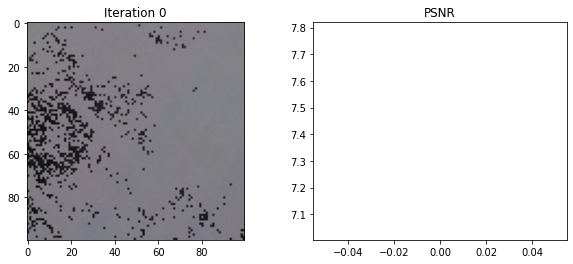

Loss: 0.05713916942477226
Loss: 0.058744750916957855


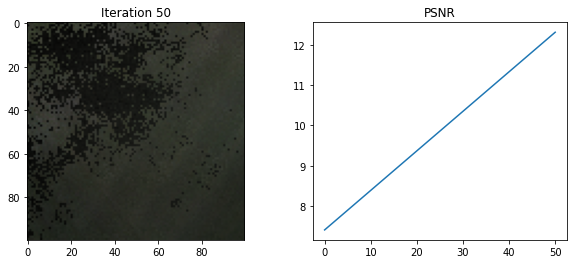

Loss: 0.024416424334049225
Loss: 0.02712564542889595


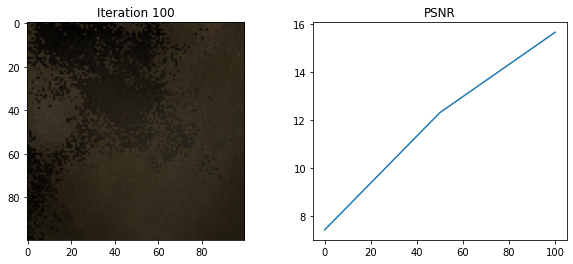

Loss: 0.06652629375457764
Loss: 0.06832496076822281


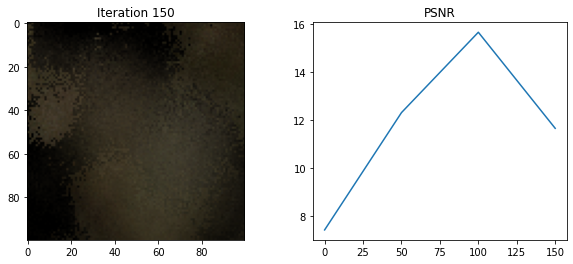

Loss: 0.06357664614915848
Loss: 0.08493100851774216


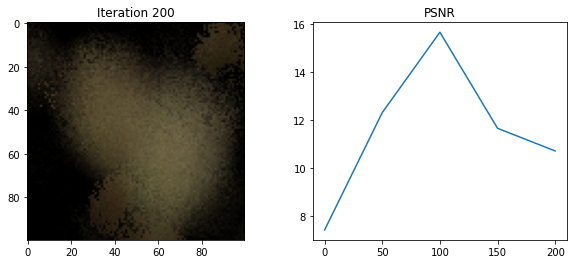

Loss: 0.03070717491209507
Loss: 0.05630659684538841


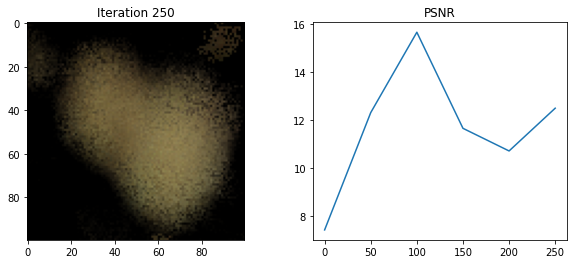

Loss: 0.026576580479741096
Loss: 0.040106192231178284


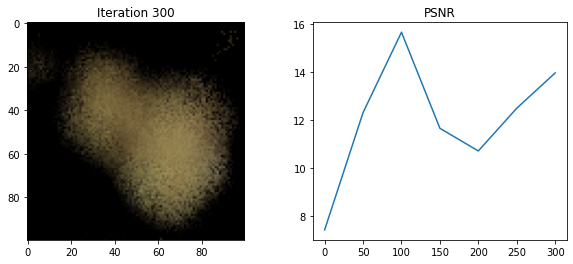

Loss: 0.025020746514201164
Loss: 0.04083773121237755


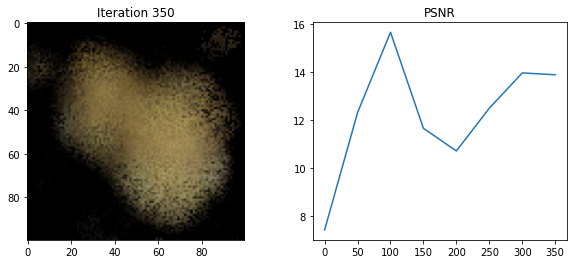

Loss: 0.01959303393959999
Loss: 0.03129095584154129


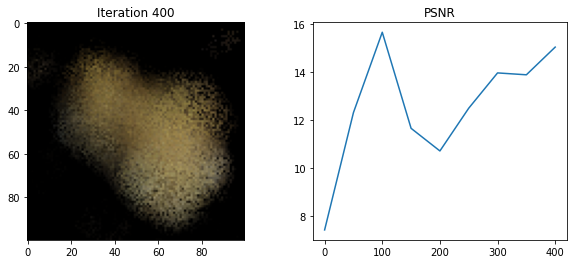

Loss: 0.03173428401350975
Loss: 0.06770998239517212


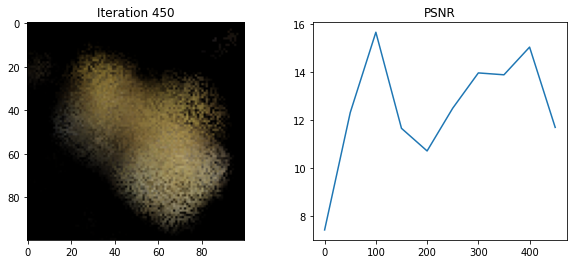

Loss: 0.016662437468767166
Loss: 0.04325154423713684


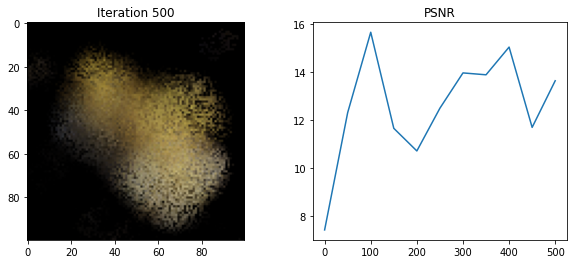

Loss: 0.02167351357638836
Loss: 0.03997809439897537


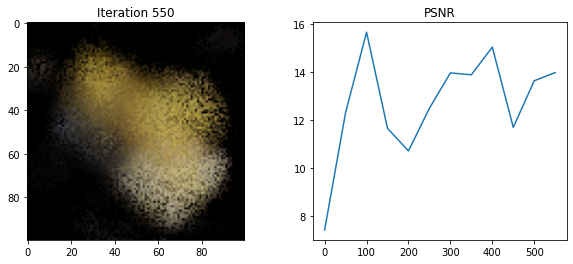

Loss: 0.03564519062638283
Loss: 0.11615627259016037


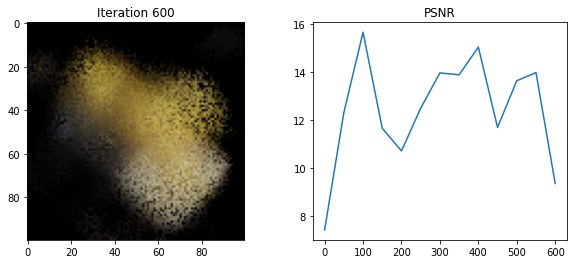

Loss: 0.01871107891201973
Loss: 0.056968241930007935


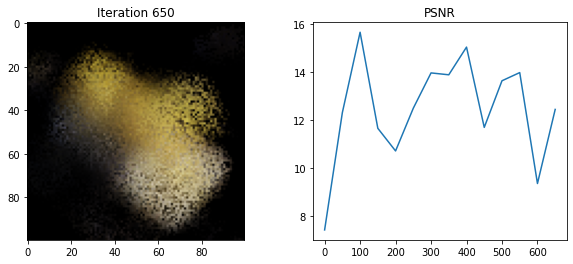

Loss: 0.012660842388868332
Loss: 0.047573886811733246


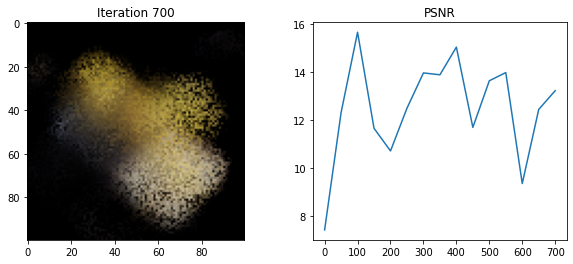

Loss: 0.019374698400497437
Loss: 0.05117417871952057


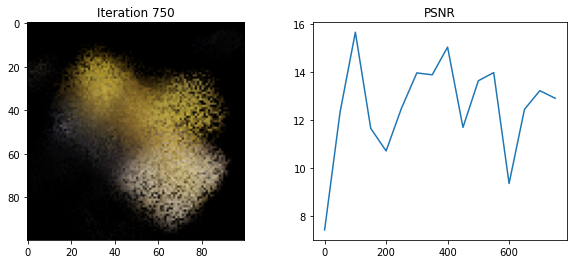

Loss: 0.025770097970962524
Loss: 0.0352545790374279


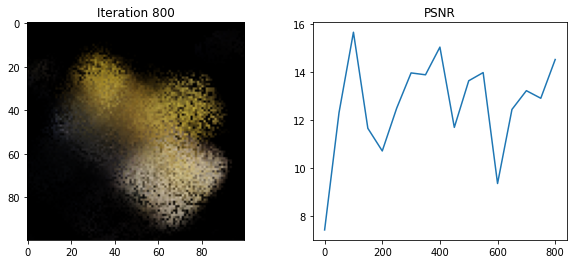

Loss: 0.023102030158042908
Loss: 0.04841792955994606


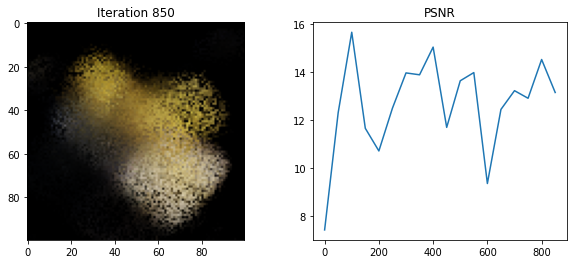

Loss: 0.030790168792009354
Loss: 0.09700416773557663


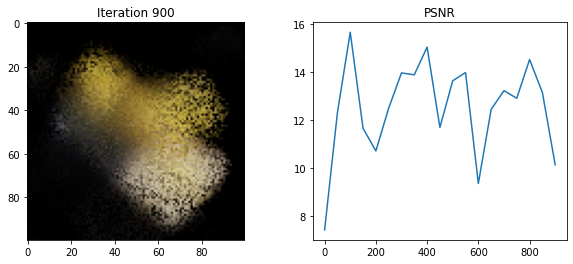

Loss: 0.01915973238646984
Loss: 0.04373786225914955


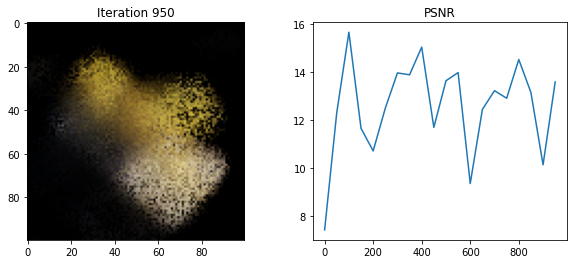

Loss: 0.015777375549077988
Loss: 0.05199046432971954


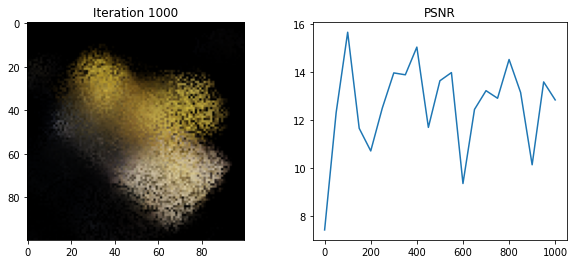

Loss: 0.020121989771723747
Loss: 0.04742121696472168


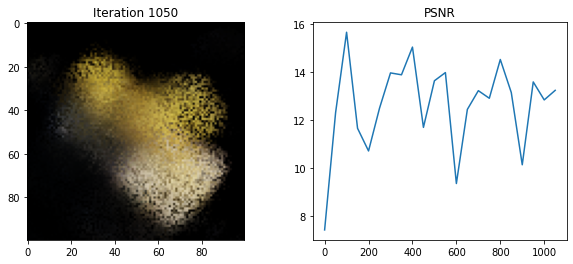

Loss: 0.018784312531352043
Loss: 0.056405313313007355


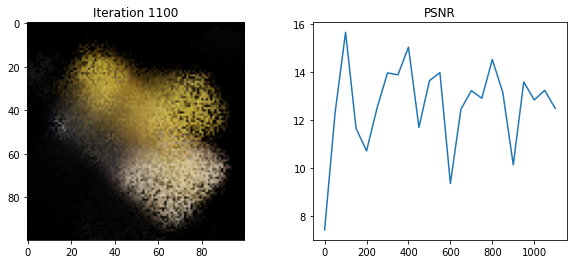

Loss: 0.04189496487379074
Loss: 0.11671063303947449


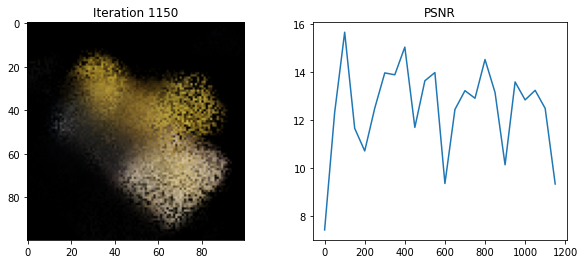

Loss: 0.011051923036575317
Loss: 0.051832206547260284


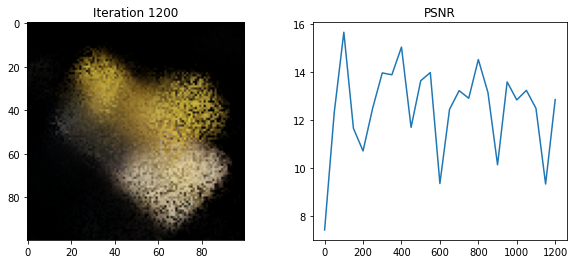

Loss: 0.018125806003808975
Loss: 0.05190405994653702


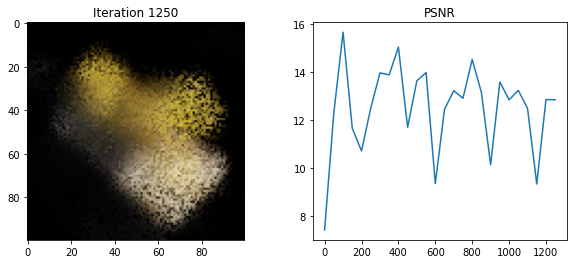

Loss: 0.017626391723752022
Loss: 0.07674682885408401


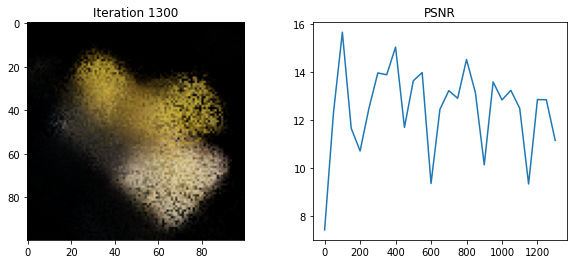

Loss: 0.021275756880640984
Loss: 0.031063254922628403


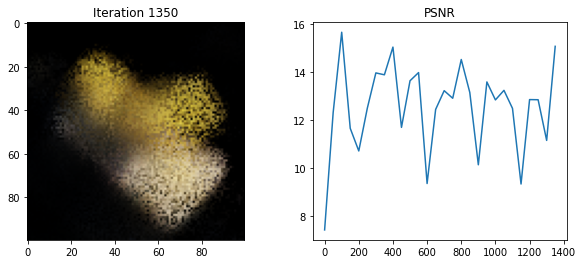

Loss: 0.016588862985372543
Loss: 0.05242031812667847


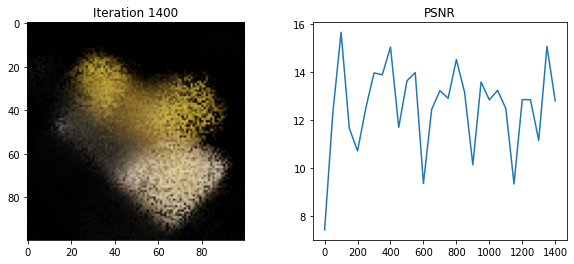

Loss: 0.02924266830086708
Loss: 0.12204549461603165


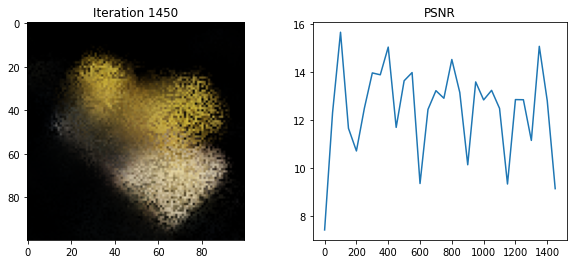

Loss: 0.03549494594335556
Loss: 0.11747096478939056


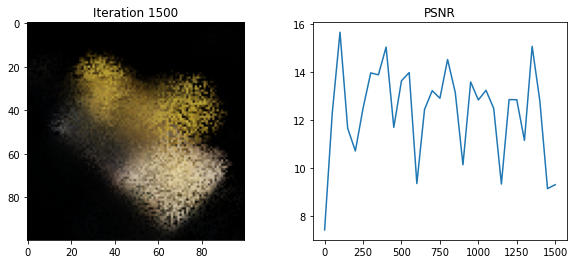

Loss: 0.024610262364149094
Loss: 0.08022752404212952


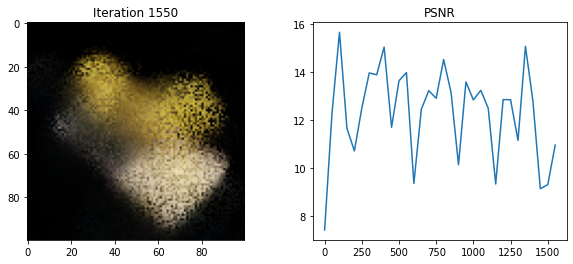

Loss: 0.015906507149338722
Loss: 0.061392419040203094


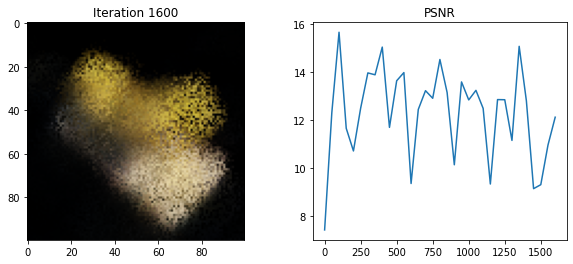

Loss: 0.018566381186246872
Loss: 0.06364107877016068


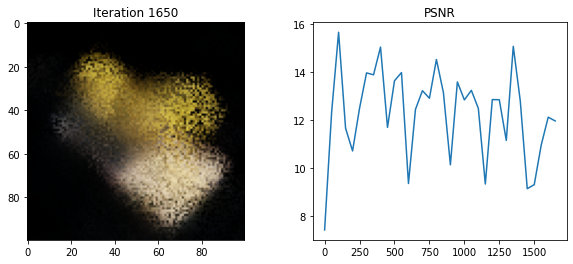

Loss: 0.012093539349734783
Loss: 0.0656498372554779


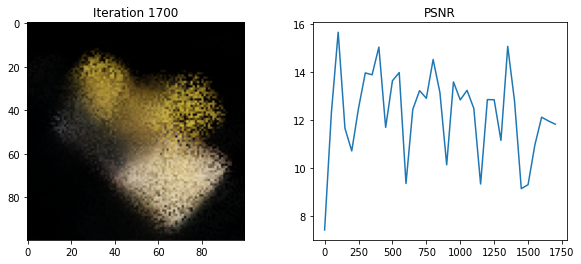

Loss: 0.017761442810297012
Loss: 0.0790414810180664


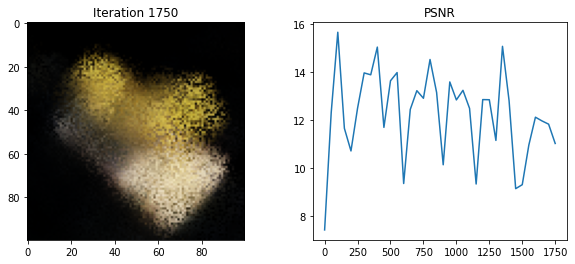

Loss: 0.01898896135389805
Loss: 0.057733599096536636


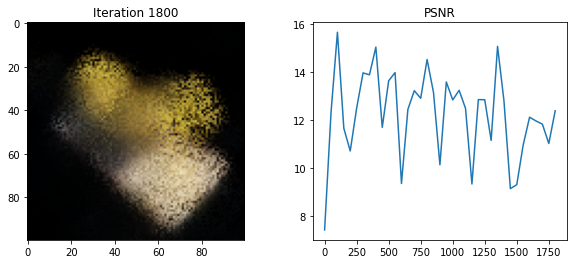

Loss: 0.035694461315870285
Loss: 0.11488019675016403


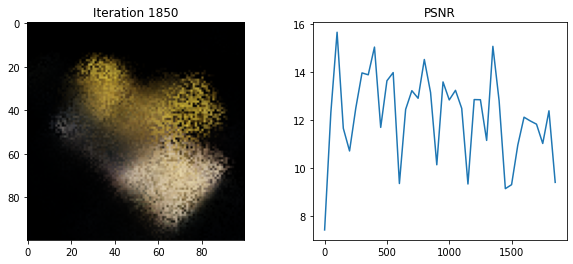

Loss: 0.0128638269379735
Loss: 0.05991601571440697


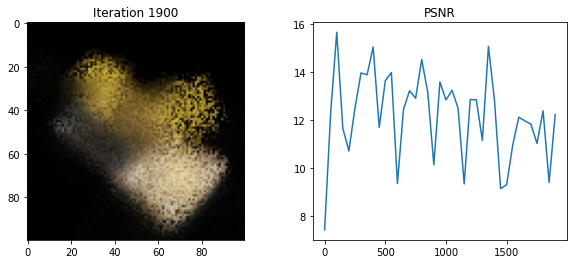

Loss: 0.016505183652043343
Loss: 0.059680819511413574


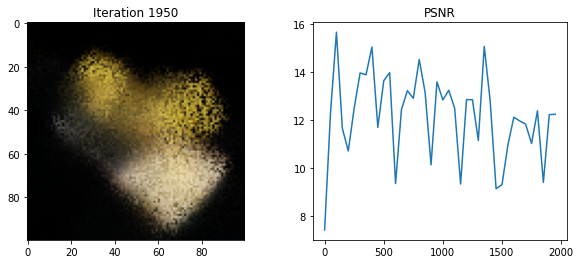

Loss: 0.019516361877322197
Loss: 0.06614519655704498


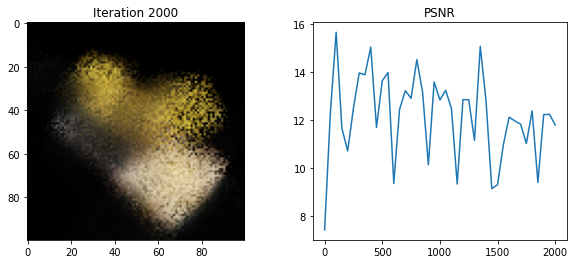

Loss: 0.032124560326337814
Loss: 0.1291653960943222


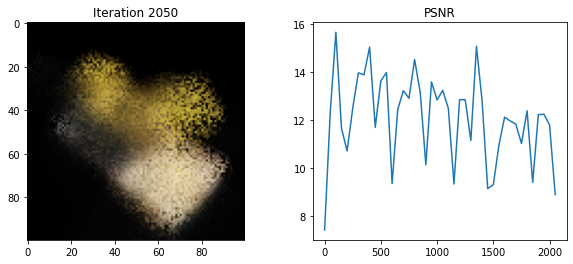

Loss: 0.014172207564115524
Loss: 0.05741491913795471


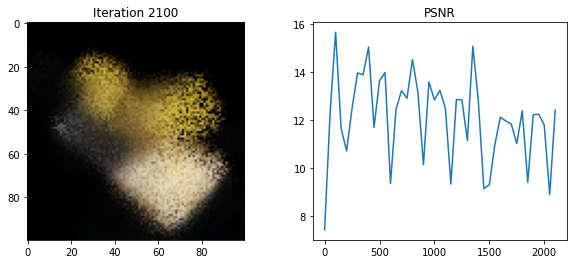

Loss: 0.02035381644964218
Loss: 0.06157451122999191


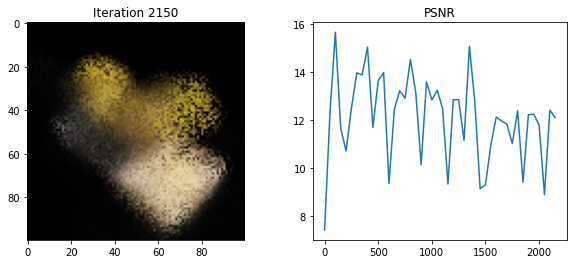

Loss: 0.018073255196213722
Loss: 0.06885167956352234


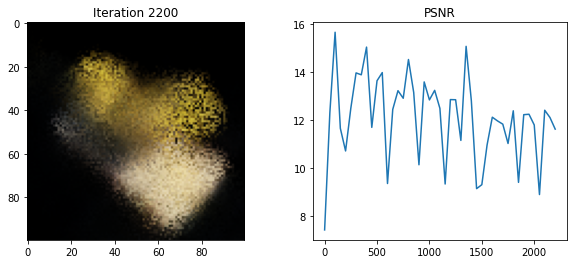

Loss: 0.01710958033800125
Loss: 0.08098112791776657


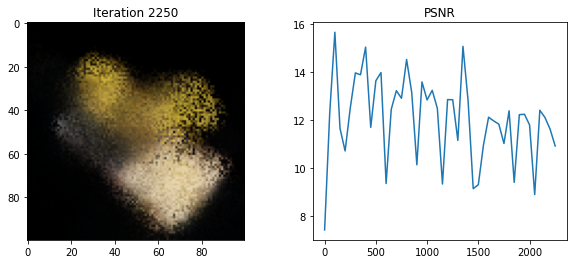

Loss: 0.01530481781810522
Loss: 0.06585580855607986


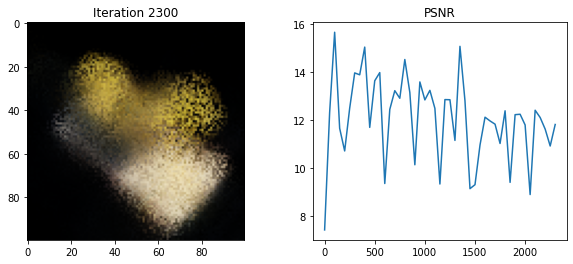

Loss: 0.010217179544270039
Loss: 0.06884174793958664


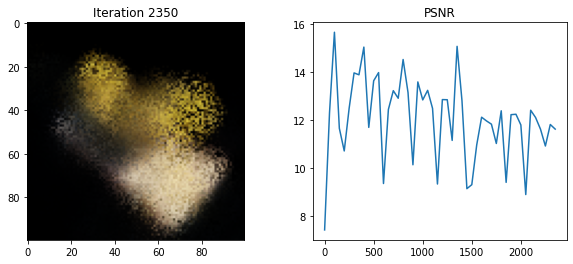

Loss: 0.01170400995761156
Loss: 0.07953760027885437


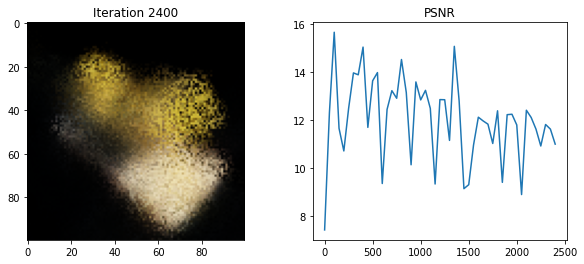

Loss: 0.011943405494093895
Loss: 0.07352232933044434


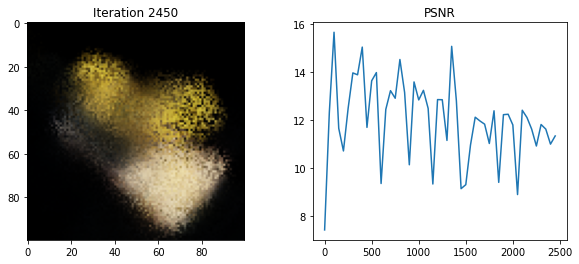

Loss: 0.01643470861017704
Loss: 0.053060900419950485


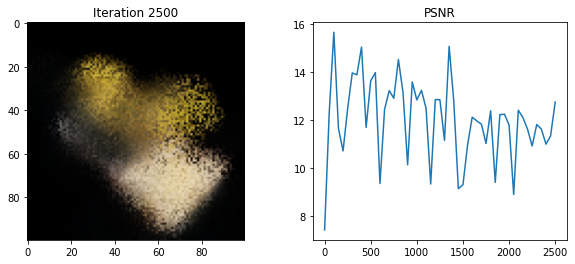

Loss: 0.013016465120017529
Loss: 0.08279954642057419


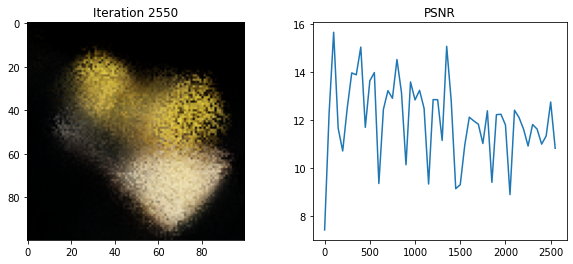

Loss: 0.013507342897355556
Loss: 0.08059117197990417


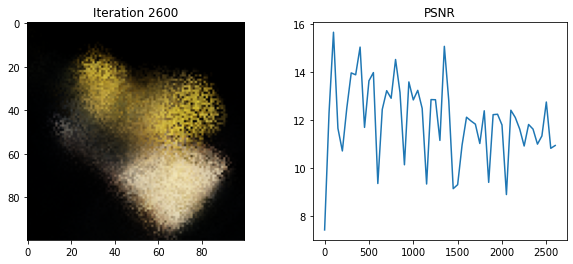

Loss: 0.020410960540175438
Loss: 0.08014344424009323


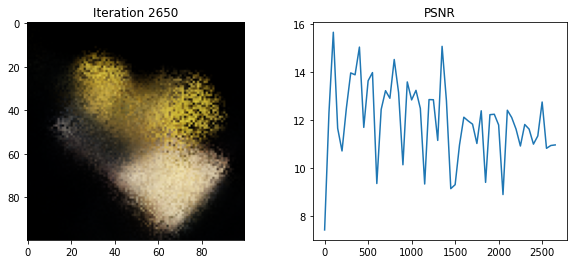

Loss: 0.02598053403198719
Loss: 0.1258150041103363


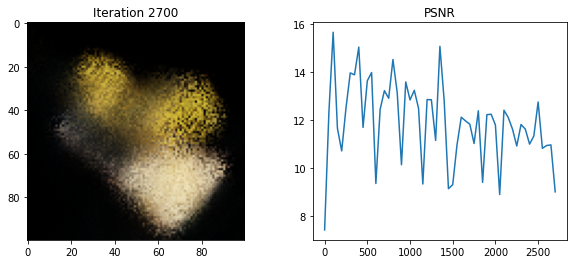

Loss: 0.025281645357608795
Loss: 0.07972747832536697


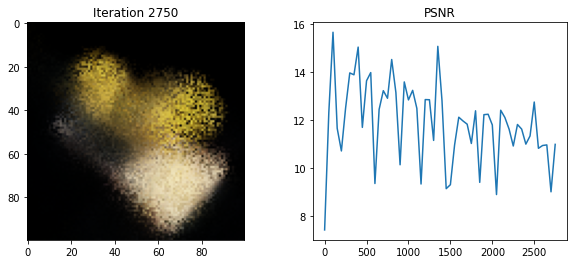

Loss: 0.01588490605354309
Loss: 0.07706835865974426


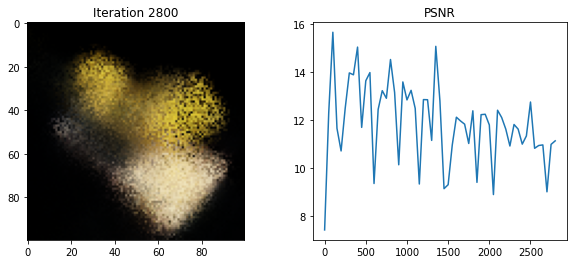

Loss: 0.025993410497903824
Loss: 0.11470943689346313


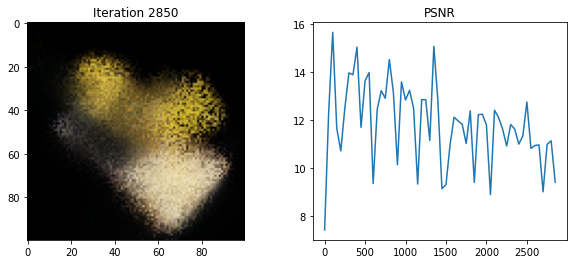

Loss: 0.025231510400772095
Loss: 0.11536284536123276


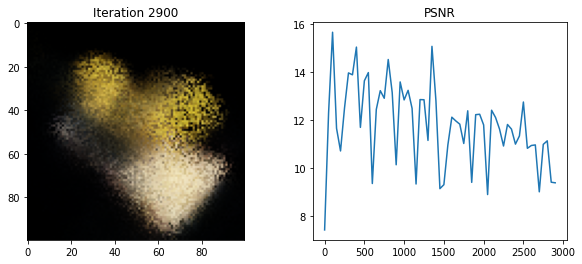

Loss: 0.02169252745807171
Loss: 0.1152711734175682


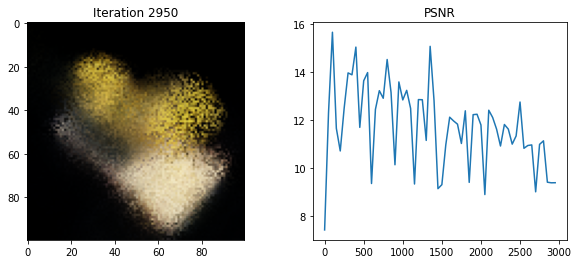

Loss: 0.019811060279607773
Loss: 0.0927768126130104


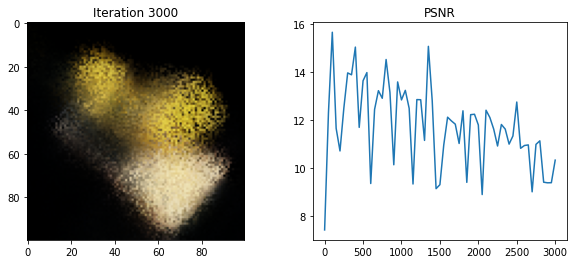

Loss: 0.014350921846926212
Loss: 0.07005289196968079


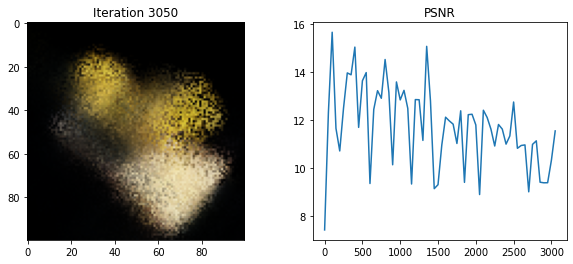

Loss: 0.01912911795079708
Loss: 0.052199188619852066


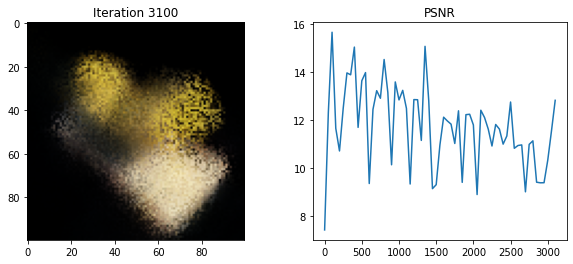

Loss: 0.01747671142220497
Loss: 0.07562953978776932


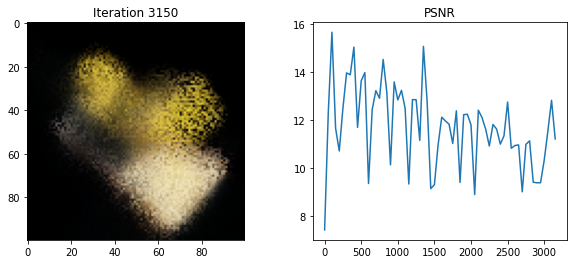

Loss: 0.010775253176689148
Loss: 0.07522875815629959


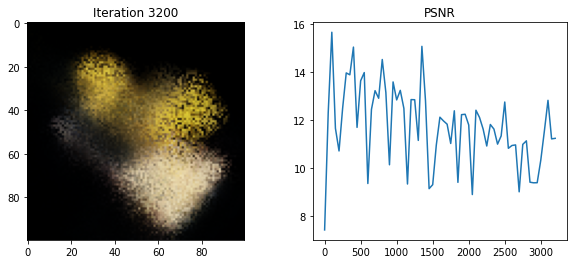

Loss: 0.016651326790452003
Loss: 0.1058126837015152


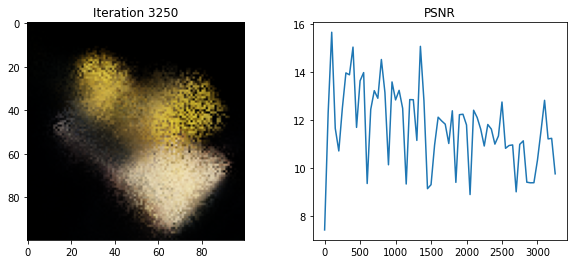

Loss: 0.01796979270875454
Loss: 0.08296439051628113


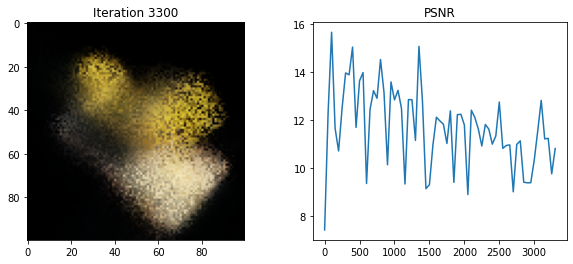

Loss: 0.023885028436779976
Loss: 0.11466733366250992


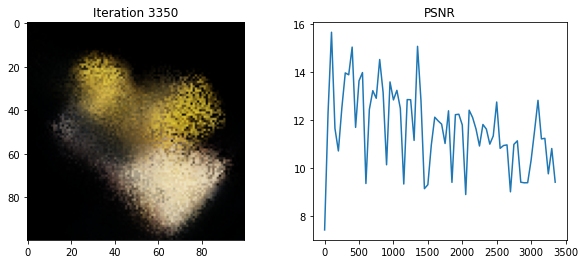

Loss: 0.014539660885930061
Loss: 0.08824551105499268


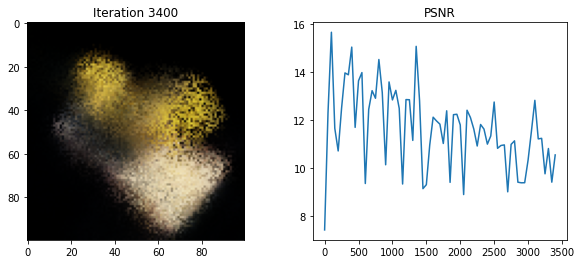

Loss: 0.015599409118294716
Loss: 0.08712444454431534


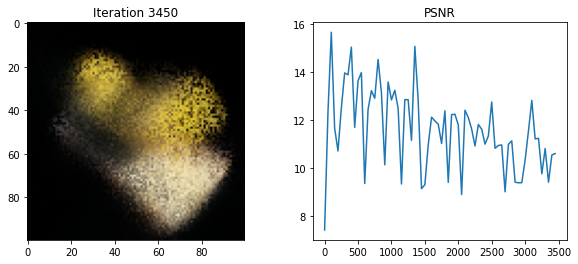

Loss: 0.012598500587046146
Loss: 0.07386313378810883


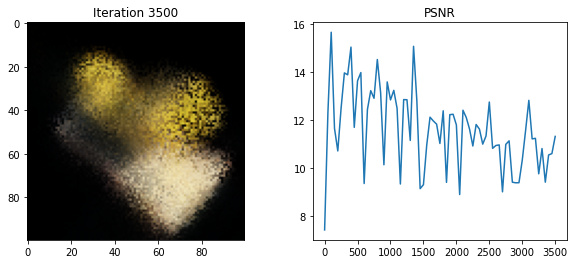

Loss: 0.012451973743736744
Loss: 0.0836830660700798


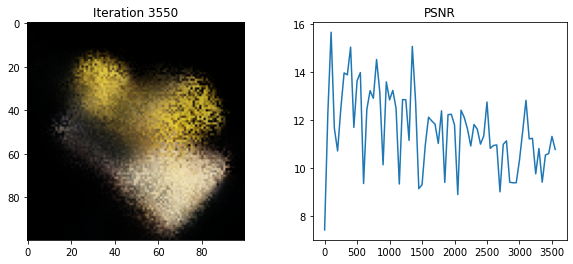

Loss: 0.0191141739487648
Loss: 0.09716333448886871


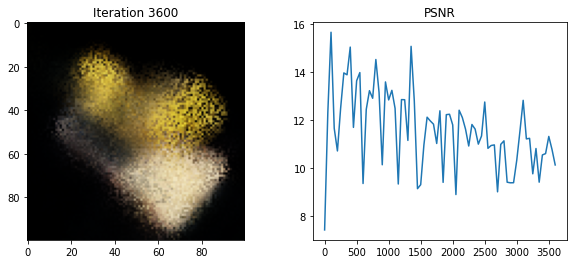

Loss: 0.019469819962978363
Loss: 0.04051907733082771


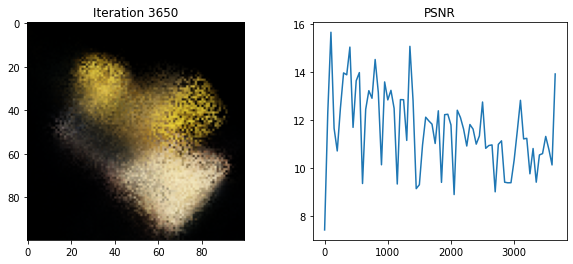

Loss: 0.017593489959836006
Loss: 0.08662546426057816


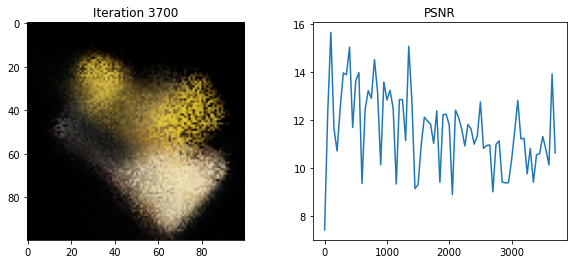

Loss: 0.02421978861093521
Loss: 0.14347657561302185


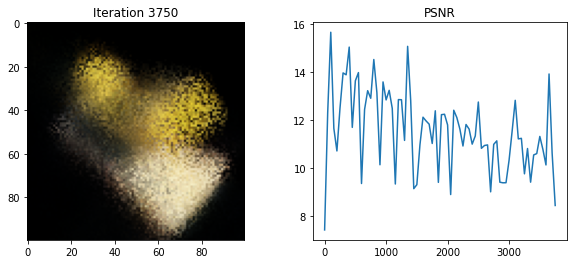

Loss: 0.015008565038442612
Loss: 0.0920301079750061


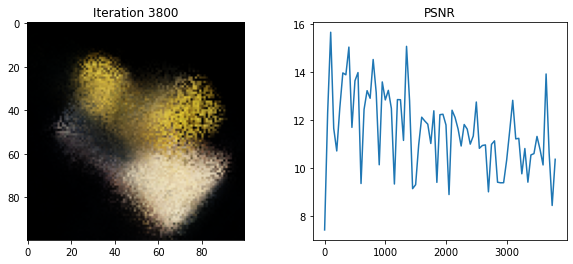

Loss: 0.019092420116066933
Loss: 0.030964843928813934


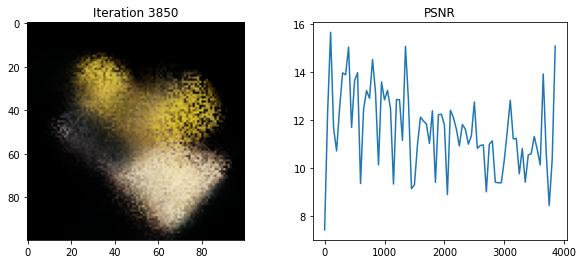

Loss: 0.02467629872262478
Loss: 0.06078745052218437


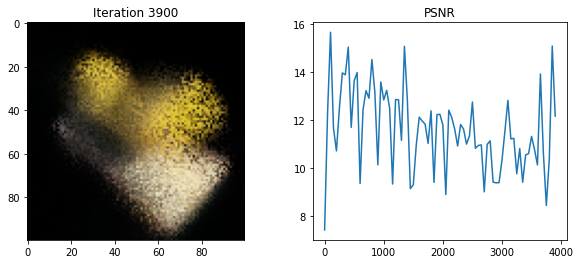

Loss: 0.015549561008810997
Loss: 0.06399428099393845


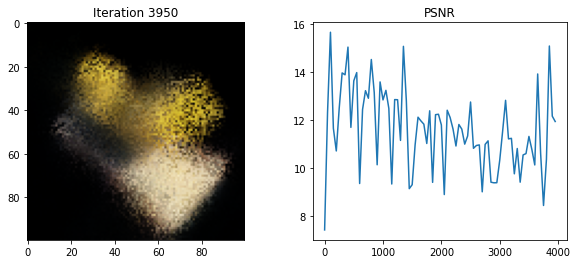

Loss: 0.01585361734032631
Loss: 0.10256922245025635


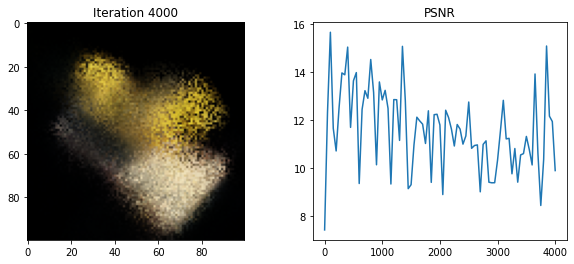

Loss: 0.021120300516486168
Loss: 0.13984417915344238


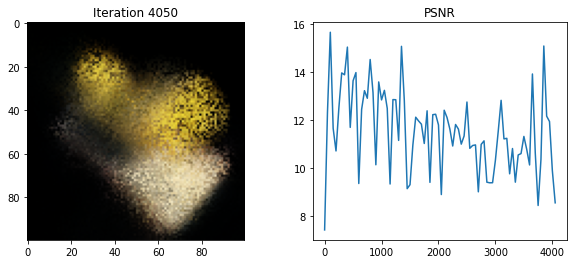

Loss: 0.0119530213996768
Loss: 0.06333377212285995


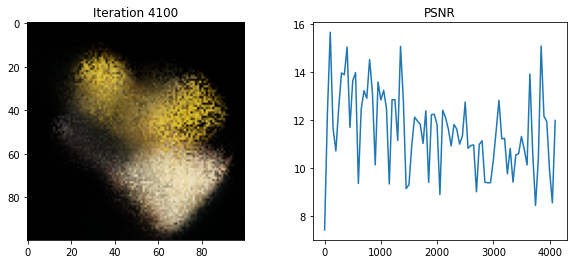

Loss: 0.020119544118642807
Loss: 0.025592012330889702


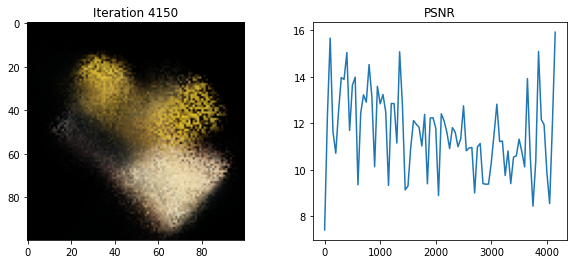

Loss: 0.01905406080186367
Loss: 0.0843791514635086


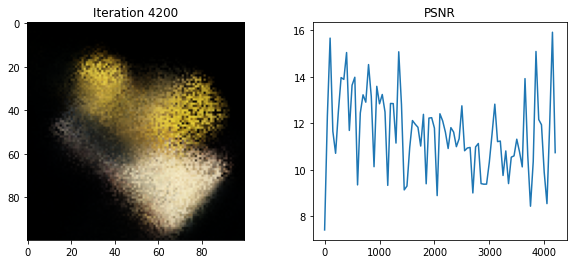

Loss: 0.024394940584897995
Loss: 0.13993382453918457


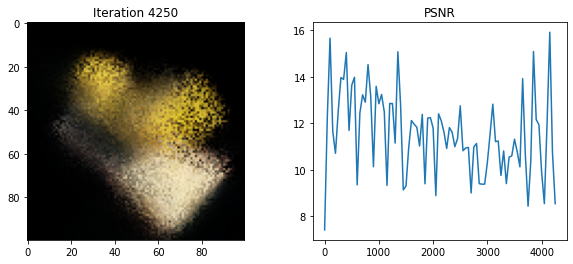

Loss: 0.02055085450410843
Loss: 0.03234416991472244


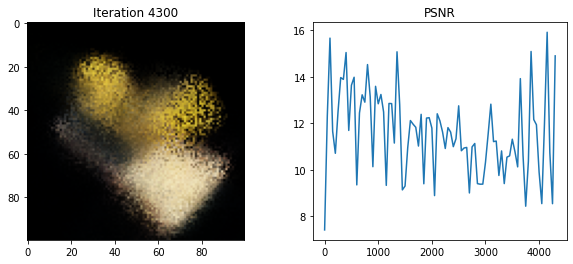

Loss: 0.011509798467159271
Loss: 0.0719374567270279


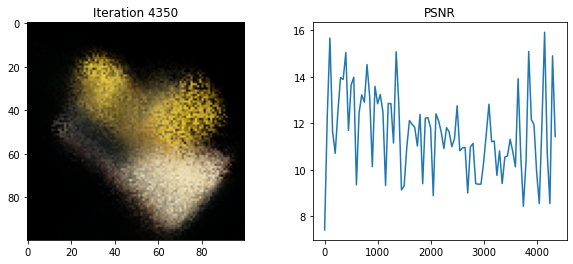

Loss: 0.019212480634450912
Loss: 0.036354247480630875


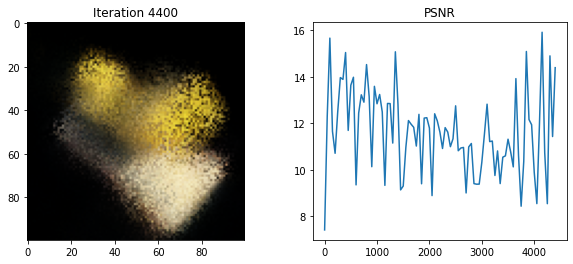

Loss: 0.022566845640540123
Loss: 0.13371947407722473


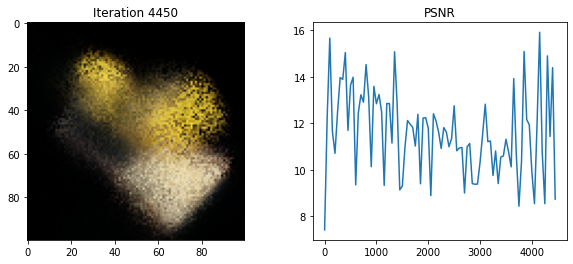

Loss: 0.011872204951941967
Loss: 0.05306408926844597


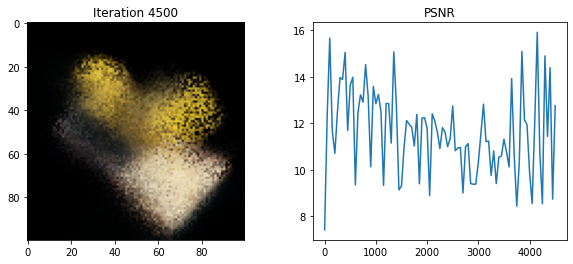

Loss: 0.020317723974585533
Loss: 0.032345470041036606


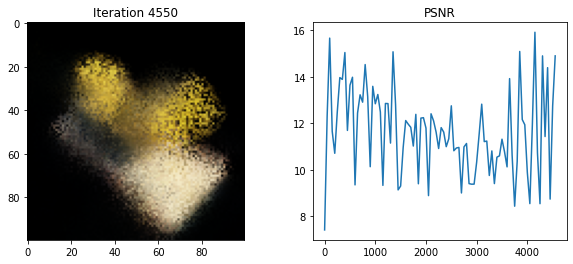

Loss: 0.015087760984897614
Loss: 0.109048992395401


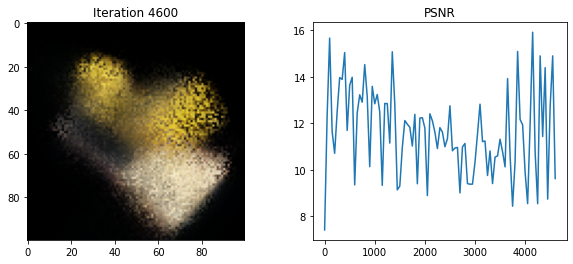

Loss: 0.007111506070941687
Loss: 0.07212414592504501


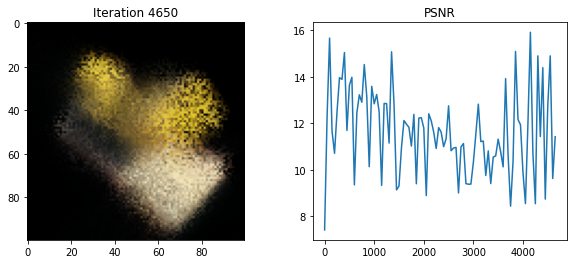

Loss: 0.0192851684987545
Loss: 0.02576024830341339


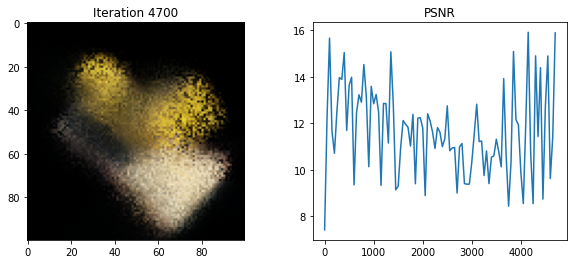

Loss: 0.008763855323195457
Loss: 0.07531629502773285


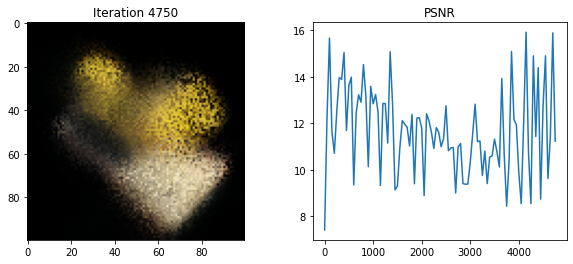

Loss: 0.014363580383360386
Loss: 0.09360603988170624


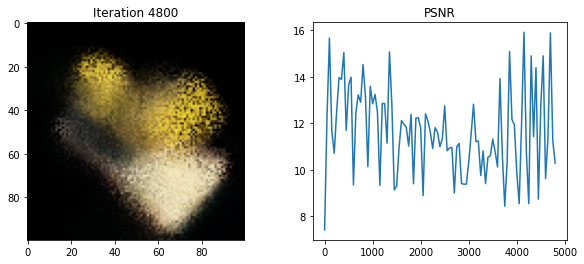

Loss: 0.015163580887019634
Loss: 0.10994385927915573


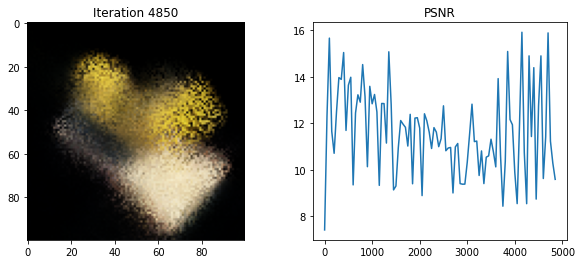

Loss: 0.013338924385607243
Loss: 0.0918319970369339


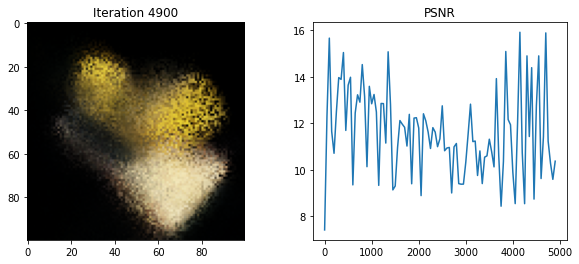

Loss: 0.018566790968179703
Loss: 0.038839880377054214


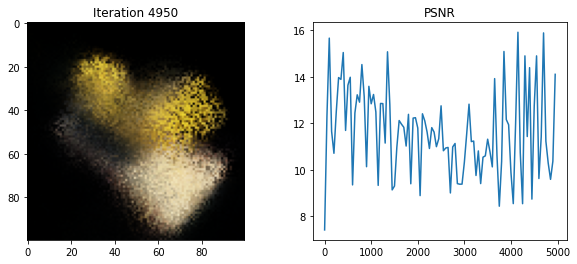

Done!


In [187]:
len_embed = 6
embed_fn = posenc

model = TwoLayerNerfModel()
model.cuda()
num_samples = 8

optimizer = torch.optim.Adam(model.parameters(), lr=5e-4)

num_iters = 5000

print_every = 50

psnrs = []
iternums = []

for i in range(num_iters):

    img_i = np.random.randint(images.shape[0])
    target = torch.from_numpy(images[img_i]).cuda()
    pose = torch.from_numpy(poses[img_i]).cuda()

    rays_o, rays_d = get_rays(H, W, focal, pose)

    rgb, depth, acc = render_rays(model, rays_o, rays_d, near, far,
                                  num_samples=num_samples, rand=True,
                                  embed_fn=posenc)
    loss = torch.nn.functional.mse_loss(rgb, target)
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    if i % print_every == 0:
      print("Loss:", loss.item())

      rays_o, rays_d = get_rays(H, W, focal, testpose)
      rgb, depth, acc = render_rays(model, rays_o, rays_d, near, far,
                                    num_samples=num_samples, rand=True,
                                    embed_fn=posenc)
      loss = torch.nn.functional.mse_loss(rgb, target)
      print("Loss:", loss.item())
      psnr = -10. * torch.log10(loss)
      psnrs.append(psnr.item())
      iternums.append(i)

      plt.figure(figsize=(10, 4))
      plt.subplot(121)
      plt.imshow(rgb.detach().cpu().numpy())
      plt.title(f"Iteration {i}")
      plt.subplot(122)
      plt.plot(iternums, psnrs)
      plt.title("PSNR")
      plt.show()

print("Done!")


In [188]:
model = TinyNerfModel(depth=8)
model.cuda()

a = []
for i in range(200):
  a.append(model(torch.rand(256, 39).cuda()))
a = torch.cat(a, 0)
a.shape

torch.Size([51200, 4])

# Conclusion

1. I learned about the working of NERF, what types of methods can be used to work on it. Got to know how important this topic is in the industry. Using a shallower model allows faster convergence. The difference between coarse and fine model. I learned how a model can be trained on single and multiple network.

2. Calculated the PSNR graph while training to evaluate the model. 

3. Found difficulty in obtaining the result as a video due to CUDA error. There was a problem with the memory allocation due to which the video was not rendered. 

4. If I had more time or resources I would definitly continue or expand upon the work I have already done.

5. Cones are cast, conical frustum positions and sizes are encoded, and a single neural network is trained to model the scene at various scales.

In [217]:
trans_t = lambda t : torch.Tensor([
    [1,0,0,0],
    [0,1,0,0],
    [0,0,1,t],
    [0,0,0,1]]).float()

rot_phi = lambda phi : torch.Tensor([
    [1,0,0,0],
    [0,np.cos(phi),-np.sin(phi),0],
    [0,np.sin(phi), np.cos(phi),0],
    [0,0,0,1]]).float()

rot_theta = lambda th : torch.Tensor([
    [np.cos(th),0,-np.sin(th),0],
    [0,1,0,0],
    [np.sin(th),0, np.cos(th),0],
    [0,0,0,1]]).float()


def pose_spherical(theta, phi, radius):
    c2w = trans_t(radius).cuda()
    c2w = rot_phi(phi/180.*np.pi).cuda() @ c2w
    c2w = rot_theta(theta/180.*np.pi).cuda() @ c2w
    c2w = torch.Tensor(np.array([[-1,0,0,0],[0,0,1,0],[0,1,0,0],[0,0,0,1]])).cuda() @ c2w
    return c2w

In [218]:
num_samples = 16
def f(**kwargs):
    c2w = pose_spherical(**kwargs)
    rays_o, rays_d = get_rays_pt(H, W, focal, c2w[:3,:4])
    rgb, depth, acc = render_rays(model, rays_o, rays_d, near=2., far=6., num_samples=num_samples)
    img = np.clip(rgb,0,1)
    
    plt.figure(2, figsize=(20,6))
    plt.imshow(img)
    plt.show()
    

sldr = lambda v, mi, ma: widgets.FloatSlider(
    value=v,
    min=mi,
    max=ma,
    step=.01,
)

names = [
    ['theta', [100., 0., 360]],
    ['phi', [-30., -90, 0]],
    ['radius', [4., 3., 5.]],
]

In [219]:
with torch.no_grad():
  interactive_plot = interactive(f, **{s[0] : sldr(*s[1]) for s in names})
  output = interactive_plot.children[-1]
  output.layout.height = '350px'
  interactive_plot

In [220]:
frames = []

for th in tqdm(np.linspace(0., 360., 120, endpoint=False)):
    c2w = pose_spherical(th, -30., 4.).cuda()
    rays_o, rays_d = get_rays(H, W, focal, c2w[:3,:4])
    rgb, depth, acc = render_rays(model, rays_o, rays_d, near=2., far=6., num_samples=num_samples)
    frames.append((255*np.clip(rgb,0,1)).astype(np.uint8))

f = 'video.mp4'
imageio.mimwrite(f, frames, fps=30, quality=7)

<ipython-input-220-107f013d6ea3>:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for th in tqdm(np.linspace(0., 360., 120, endpoint=False)):


  0%|          | 0/120 [00:00<?, ?it/s]

OutOfMemoryError: ignored

In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('video.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls autoplay loop>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
# Peak Signal to Noise Ratio (PSNR)
class PSNR(object):
    def __call__(self, pred, gt):
        mse = torch.mean((pred - gt) ** 2)
        return 10 * torch.log10(1 / mse)

In [ ]:
# Structural similarity index measure (SSIM)
class SSIM(object):
    
    def gaussian(self, w_size, sigma):
        gauss = torch.Tensor([math.exp(-(x - w_size//2)**2/float(2*sigma**2)) for x in range(w_size)])
        return gauss/gauss.sum()

    def create_window(self, w_size, channel=1):
        _1D_window = self.gaussian(w_size, 1.5).unsqueeze(1)
        _2D_window = _1D_window.mm(_1D_window.t()).float().unsqueeze(0).unsqueeze(0)
        window = _2D_window.expand(channel, 1, w_size, w_size).contiguous()
        return window

    def __call__(self, y_pred, y_true, w_size=11, size_average=True, full=False):

        if torch.max(y_pred) > 128:
            max_val = 255
        else:
            max_val = 1

        if torch.min(y_pred) < -0.5:
            min_val = -1
        else:
            min_val = 0
        L = max_val - min_val

        padd = 0
        (_, channel, height, width) = y_pred.size()
        window = self.create_window(w_size, channel=channel).to(y_pred.device)

        mu1 = F.conv2d(y_pred, window, padding=padd, groups=channel)
        mu2 = F.conv2d(y_true, window, padding=padd, groups=channel)

        mu1_sq = mu1.pow(2)
        mu2_sq = mu2.pow(2)
        mu1_mu2 = mu1 * mu2

        sigma1_sq = F.conv2d(y_pred * y_pred, window, padding=padd, groups=channel) - mu1_sq

        sigma2_sq = F.conv2d(y_true * y_true, window, padding=padd, groups=channel) - mu2_sq
        
        sigma12 = F.conv2d(y_pred * y_true, window, padding=padd, groups=channel) - mu1_mu2

        C1 = (0.01 * L) ** 2
        C2 = (0.03 * L) ** 2

        v1 = 2.0 * sigma12 + C2
        v2 = sigma1_sq + sigma2_sq + C2
        cs = torch.mean(v1 / v2)  

        ssim_map = ((2 * mu1_mu2 + C1) * v1) / ((mu1_sq + mu2_sq + C1) * v2)

        if size_average:
            ret = ssim_map.mean()
        else:
            ret = ssim_map.mean(1).mean(1).mean(1)

        if full:
            return ret, cs
        return ret

In [ ]:
def read_images_in_dir(imgs_dir):
    imgs = []
    fnames = os.listdir(imgs_dir)
    fnames.sort()
    for fname in fnames:
        if fname == "image.png" : 
            continue
            
        img_path = os.path.join(imgs_dir, fname)
        img = imageio.imread(img_path)

        img = (np.array(img) / 255.).astype(np.float32)
        img = np.transpose(img, (2, 0, 1))

        imgs.append(img)
    
    imgs = np.stack(imgs)       
    return imgs

def estim_error(estim, gt):
    errors = dict()
    metric = PSNR()

    errors["psnr"] = metric(estim, gt).item()
    metric = SSIM()

    errors["ssim"] = metric(estim, gt).item()
    return errors

def save_error(errors, save_dir):
    save_path = os.path.join(save_dir, "metrics.txt")
    f = open(save_path,"w")

    f.write( str(errors) )
    f.close()


In [ ]:
files_dir = "/content/"

estim_dir = os.path.join(files_dir,"")
gt_dir = os.path.join(files_dir,"")

estim = read_images_in_dir(estim_dir)
gt = read_images_in_dir(gt_dir)

estim = torch.Tensor(estim).cuda()
gt = torch.Tensor(gt).cuda()

errors = estim_error(estim, gt)
save_error(errors, files_dir)
print(errors)
